# Standard Maxx Analysis Template


## Notes
**Overview:**   
**Rationale:**     
**Date of Experiment:**      
**Genotypes:**    
**Sex:**    
**Light Paradigm:**    
**Design:**    
**Misc:** 

## Configuration
Configuration was standard. No new or untested code.

In [1]:
#%autoreload 1
import warnings
from Arena import *
import Tracker
import PairwiseInteractionTracker
from ExperimentalDesign import *
from Parameters import *

# Suppress all warnings
warnings.filterwarnings('ignore')

## Parameters
Just a standard arena max, accepting the default values and specifying a PAIRWISEINTERACTIONTRACKER by default. Interaction distances must be a list, although if you just want to consider one distance (e.g., 8mm) as interacting, you can specify that as [8].

In [2]:
p=Parameters()
p.set_pairwise_interaction_values_arena_max(interaction_distances=[4,8,10])
p.print()

tracking_type: TrackingType.PAIRWISEINTERACTIONTRACKER
fps: 0
mm_per_pixel: 0.145
speed_window_seconds: 1
micromove_speed_mm_sec: [0.2, 2]
walking_speed_mm_sec: 2
sleep_threshold_min: 5
interaction_distances: [4, 8, 10]


## Read in the data

Next we will read in the data to an Arena object. The format is    

`Arena(ExperimentName, parameters, data_path="./")`.   

This will automatically calculate all relevant metrics for the tracking type in question.  

The name of the experiment and predefined parameters object are required, but _data_path_ is optional (if no data directory is specified, it defaults to the current working directory).

The following files must be present in the defined data directory :
* The DTrack experiment file, which is an excel sheet with the name '_ExperimentName.xlsx_'.
* The DTrack data files themselves, which are named '_ExperimentName_Data_1.csv_', '_ExperimentName_Data_2.csv_', etc.
* An experiment file, which is named '_ExperimentName_Design.txt_'. Note that you can incorporate flipped axes to orient lights for data visualization.

In [3]:
arena = Arena.Arena('MaxxxPWI_FLIR',p,data_path='./Data/')

## Summary
Get the summary results for all trackers, including treatments, etc.   
This will copy the results to the clipboard and save the data in a file called '_ExperimentName_Summary.csv_'. It will be saved in the specified data directory.      
The semicolon at the end of the command will suppress the output to this notebook.  Remove it if you want to see the resulting dataframe.

In [4]:
arena.summarize(copy_to_clipboard=True,write_to_csvfile=True);

Or you can also create a faceted summary if you want to separate the different phases of the experiment.   
The file name will be '_ExperimentName_Summary_Facet.csv_'.

In [5]:
arena.summarize_facet(cutoffs=(10,70),copy_to_clipboard=True,write_to_csvfile=True);

Note that you can ask for the summary including only a one of the two partner flies in each tracking region.  This is helpful for plotting mostly to avoid double points.  In general you should get summary data for all flies to examine movement, etc.   This will hnappen automatically for treatment plotting and statistical comparison functions.     
   
`arena.summarize(remove_partners=True)`

## Plotting
There are many useful plotting funtions.  Some are shown below. If you have an idea for one, let me know.

**Facet plots:** One for each defined value of interaction distance.   
Then Total Distance (in mm/min).   
Cutoffs separate the acclimaton phase from the experiment phase from the cool down phase.

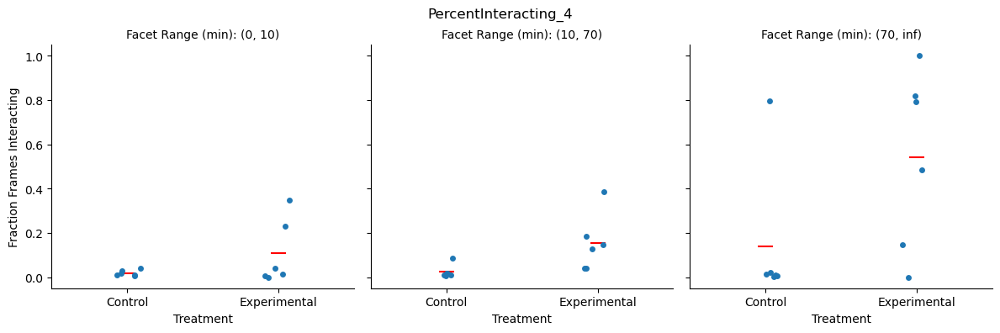

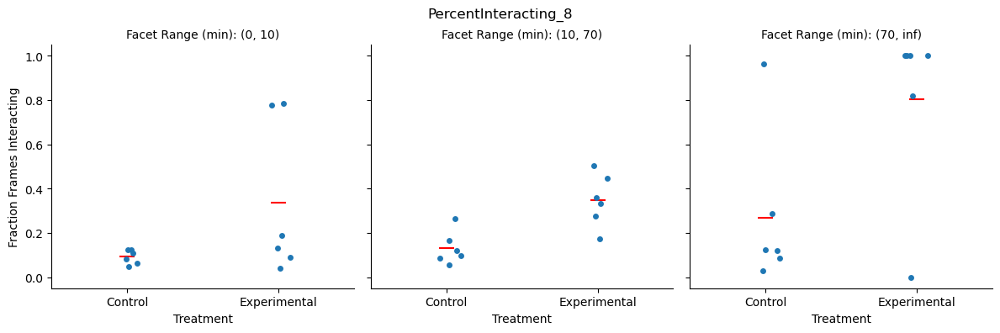

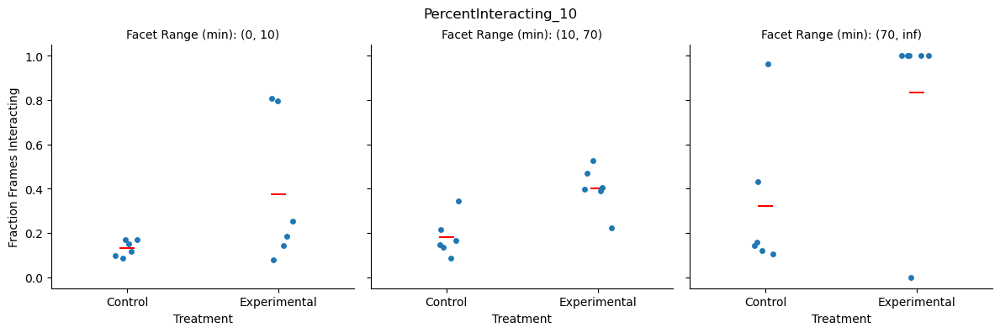

In [6]:
arena.plot_interactions_facet(cutoffs=(10,70))

The pairwise comparisons function will automatically remove partners when the metric is PercentInteracting or FramesInteracting. This will avoid double counting individual chambers, which is the experimental unit in these experiments.  It won't if you analyze something like totaldistance.

In [7]:

## This should iterate through all stated interactiond distances.
for dist in arena.parameters.interaction_distance_mm:
    arena.run_pairwise_comparisons_facet(metric="PercentInteracting_"+str(dist),cutoffs=(10,70))

############# T-Test #############
Column = PercentInteracting_4, Range Minutes = (0.00 , 10.00) 
Control vs. Experimental: T=-2.17, p=0.04100


############# T-Test #############
Column = PercentInteracting_4, Range Minutes = (10.00 , 70.00) 
Control vs. Experimental: T=-3.61, p=0.00155


############# T-Test #############
Column = PercentInteracting_4, Range Minutes = (70.00 , inf) 
Control vs. Experimental: T=-2.83, p=0.00985


############# T-Test #############
Column = PercentInteracting_8, Range Minutes = (0.00 , 10.00) 
Control vs. Experimental: T=-2.52, p=0.01935


############# T-Test #############
Column = PercentInteracting_8, Range Minutes = (10.00 , 70.00) 
Control vs. Experimental: T=-5.64, p=0.00001


############# T-Test #############
Column = PercentInteracting_8, Range Minutes = (70.00 , inf) 
Control vs. Experimental: T=-3.65, p=0.00142


############# T-Test #############
Column = PercentInteracting_10, Range Minutes = (0.00 , 10.00) 
Control vs. Experimental: T=-2.

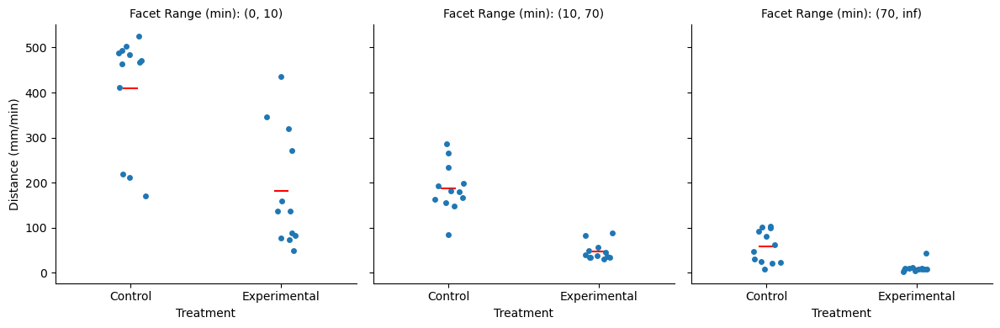

In [ ]:
## Here is the facet of TotalDistance as promised.  Most often this declines with time in the arena.
arena.plot_totaldistance_facet(cutoffs=(10,70))

In [9]:
arena.run_pairwise_comparisons_facet(metric="TotalDistance",cutoffs=(10,70))

############# T-Test #############
Column = TotalDistance, Range Minutes = (0.00 , 10.00) 
Control vs. Experimental: T=4.32, p=0.00028


############# T-Test #############
Column = TotalDistance, Range Minutes = (10.00 , 70.00) 
Control vs. Experimental: T=8.42, p=0.00000


############# T-Test #############
Column = TotalDistance, Range Minutes = (70.00 , inf) 
Control vs. Experimental: T=4.35, p=0.00026




**Tracker plots:** These show, for each tracker individually, the average interaction over windows of time and each position of the tracker over the experimenyt time.  As expected, for the time dependent interaction plots, partners are removed so that there is only one plot per chamber.  For thecoordinate plots, each separate tracker/fly gets a plot.

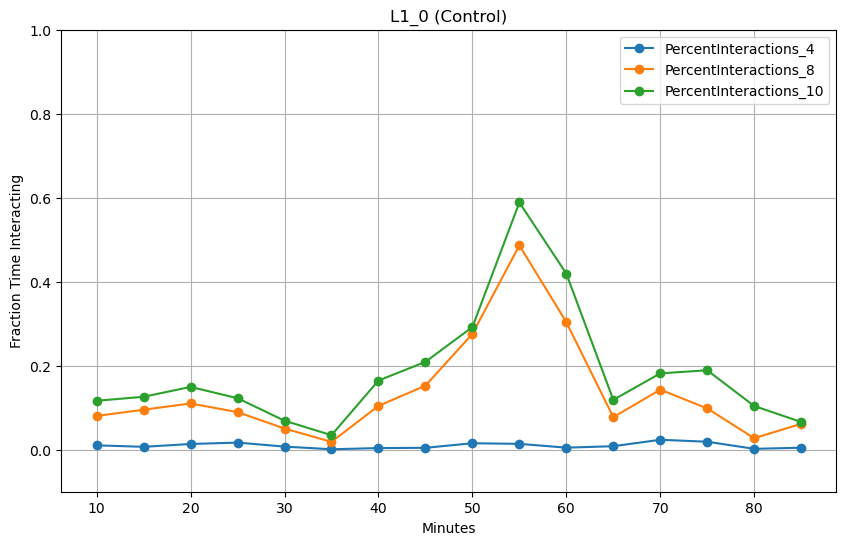

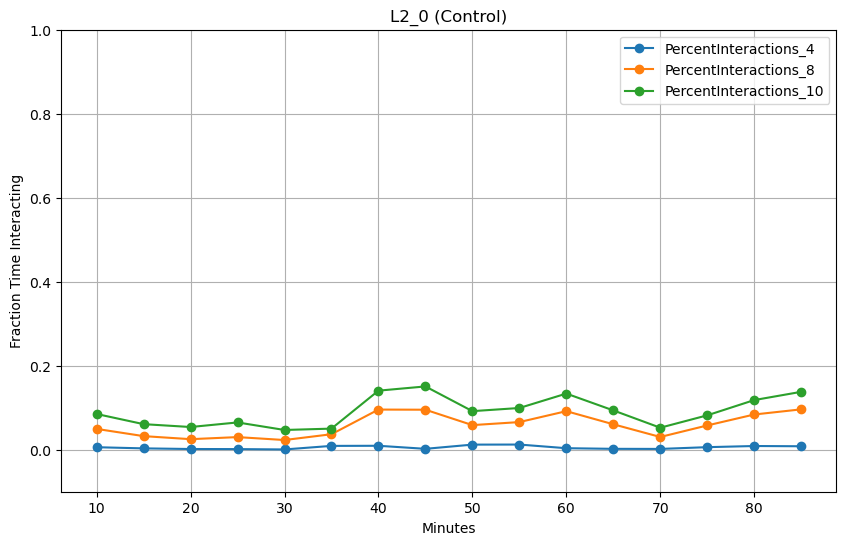

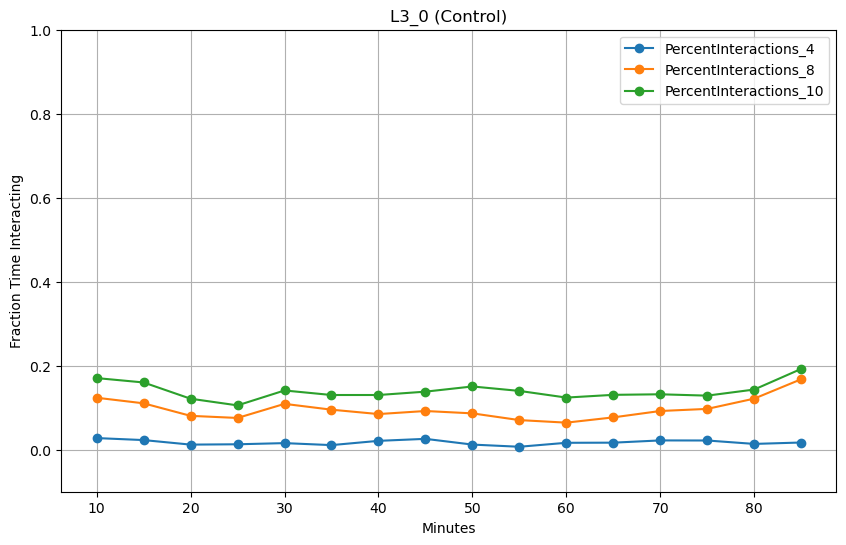

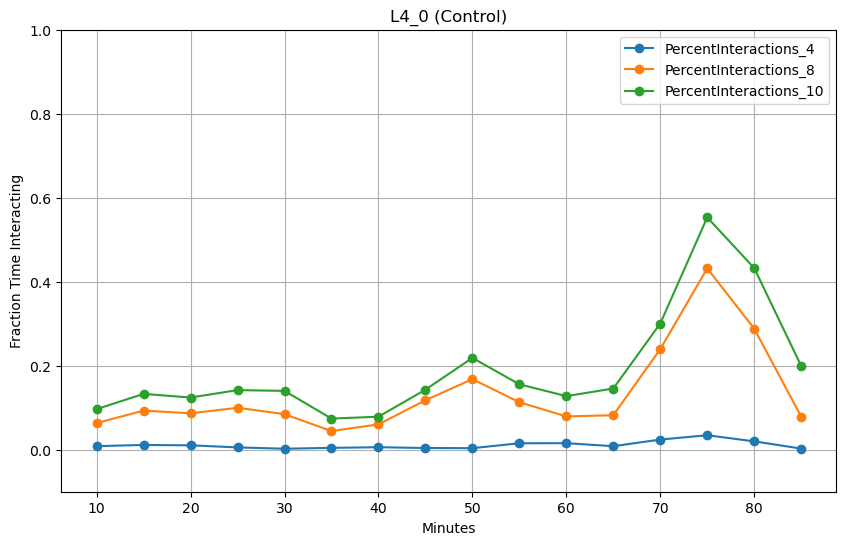

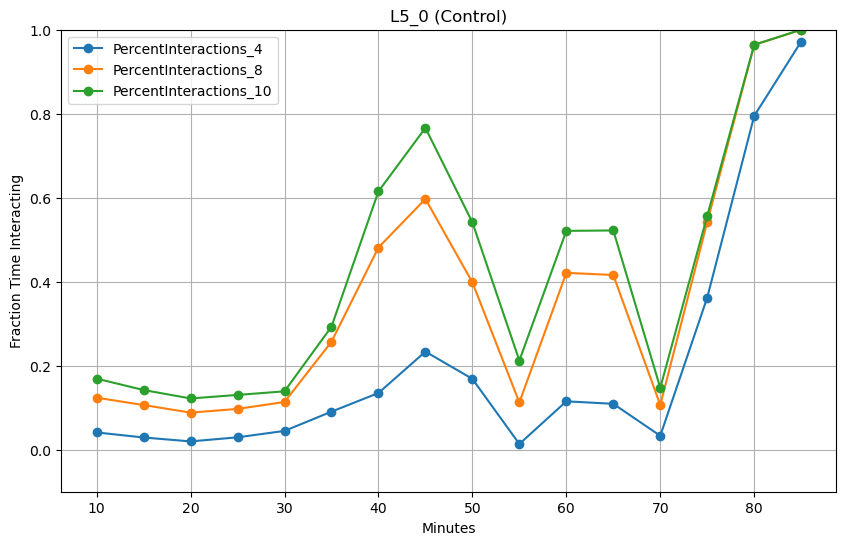

...

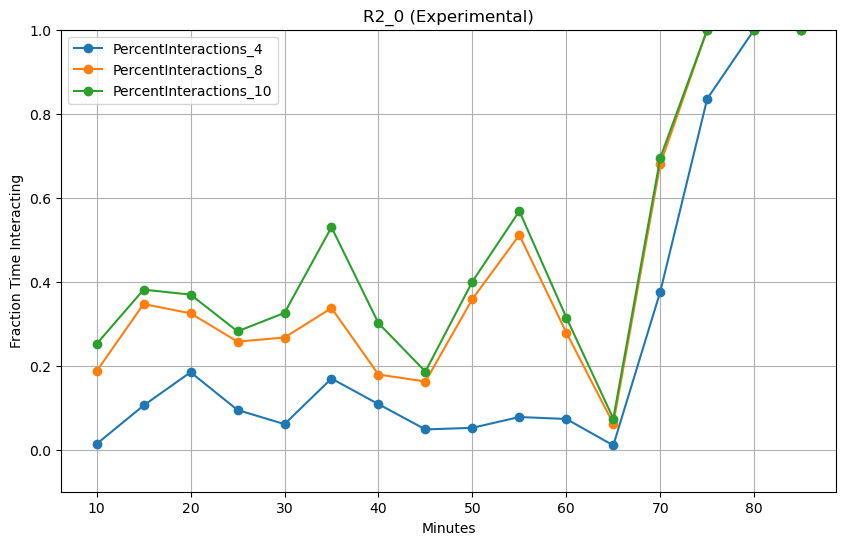

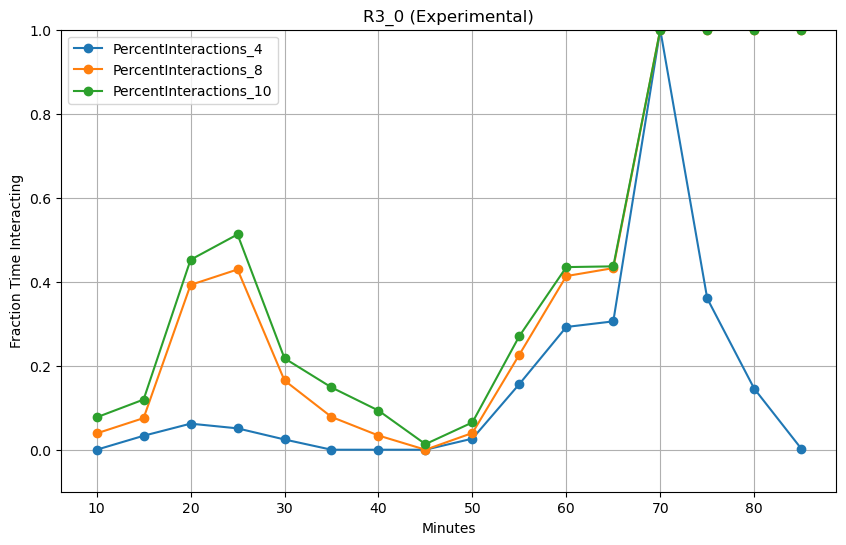

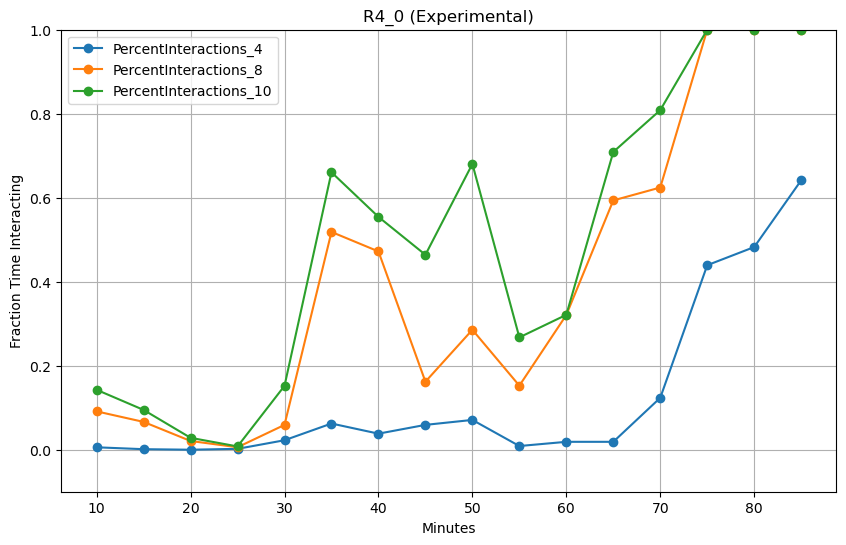

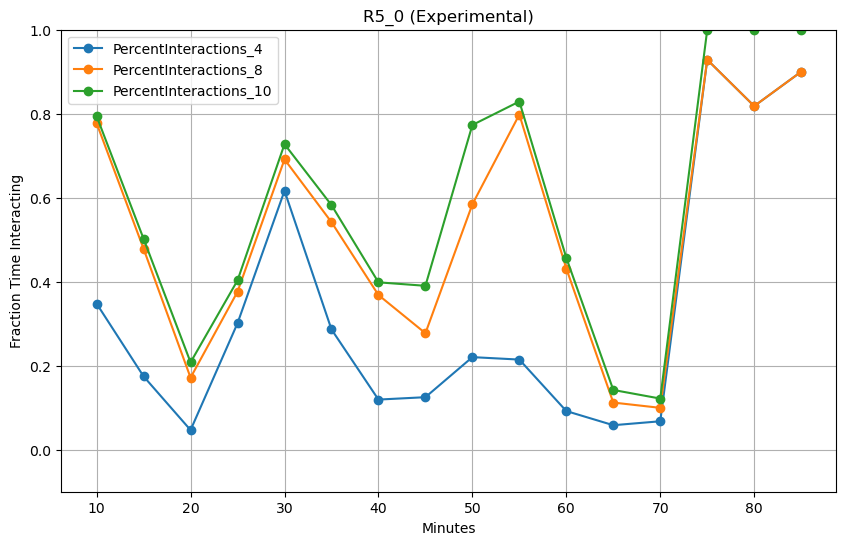

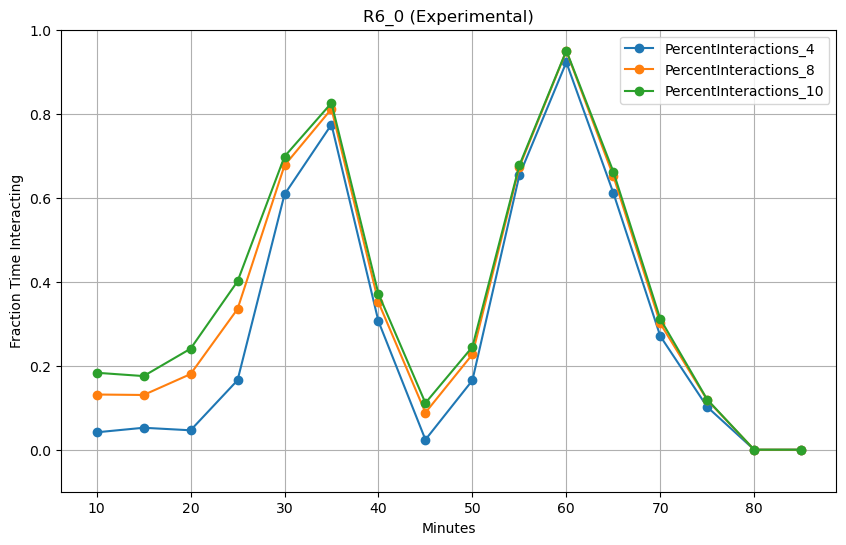

In [11]:
arena.plot_trackers_time_dependent_interactions()

**Positional Plots:** Show the X positions of each tracker as a function of time.

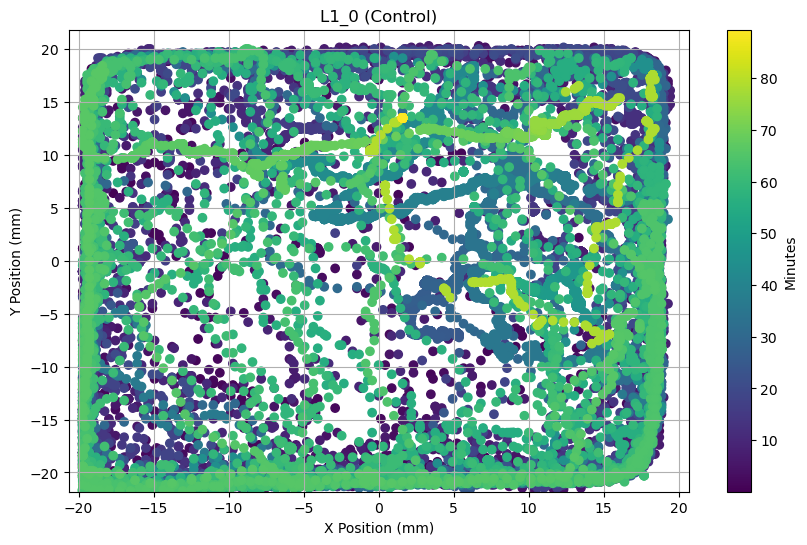

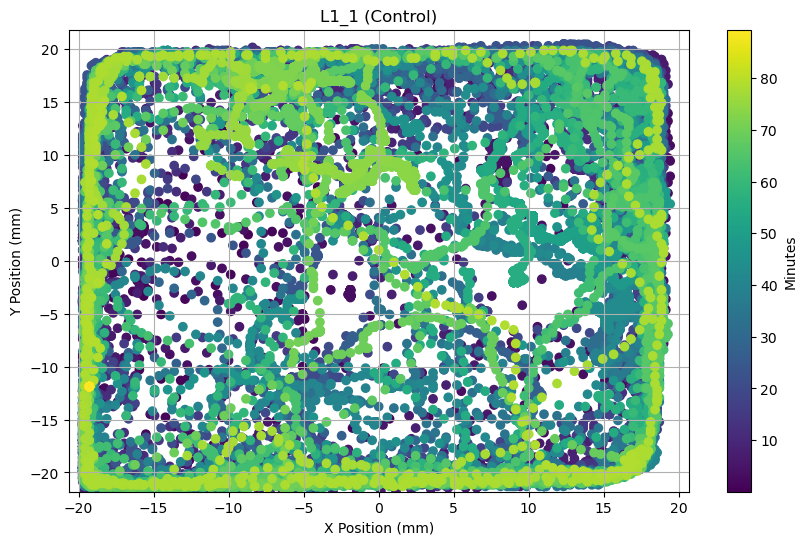

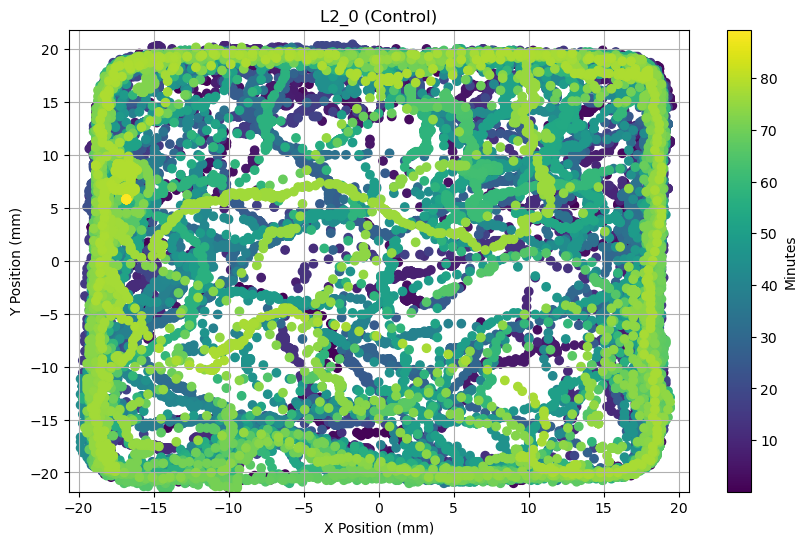

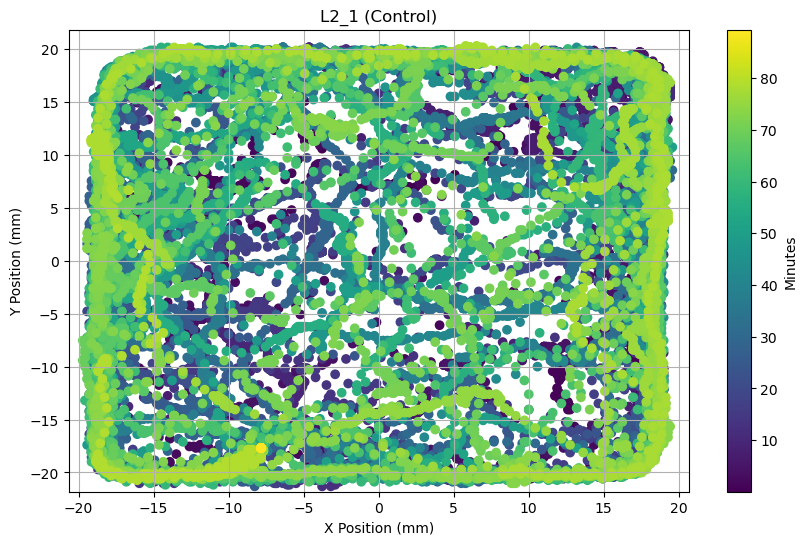

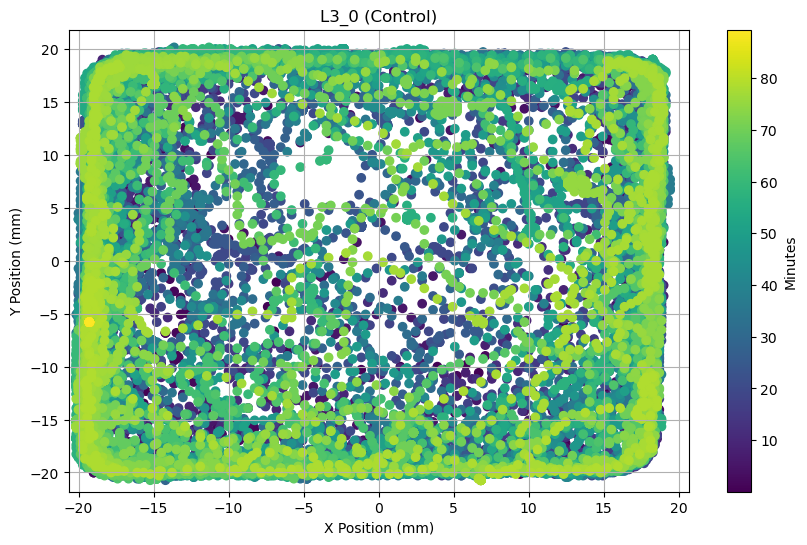

...

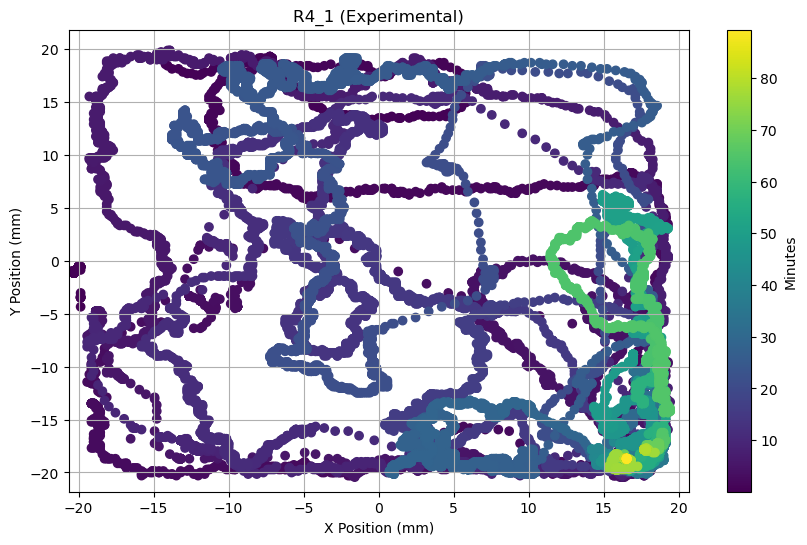

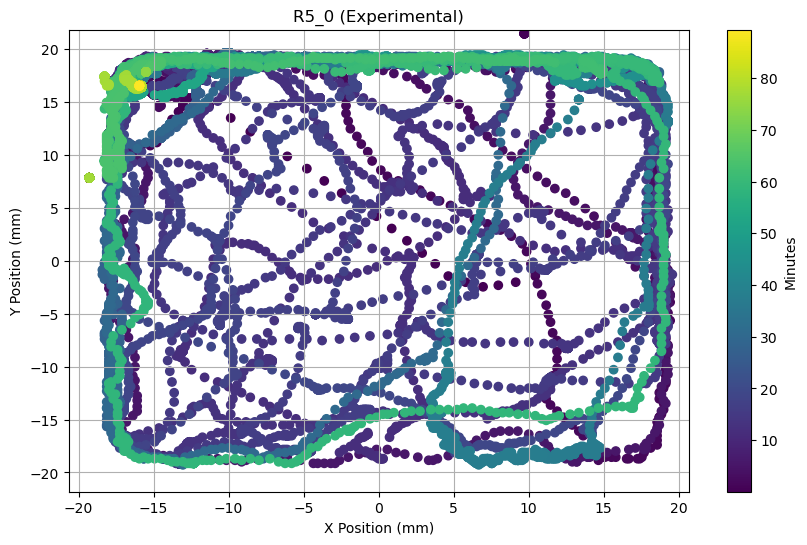

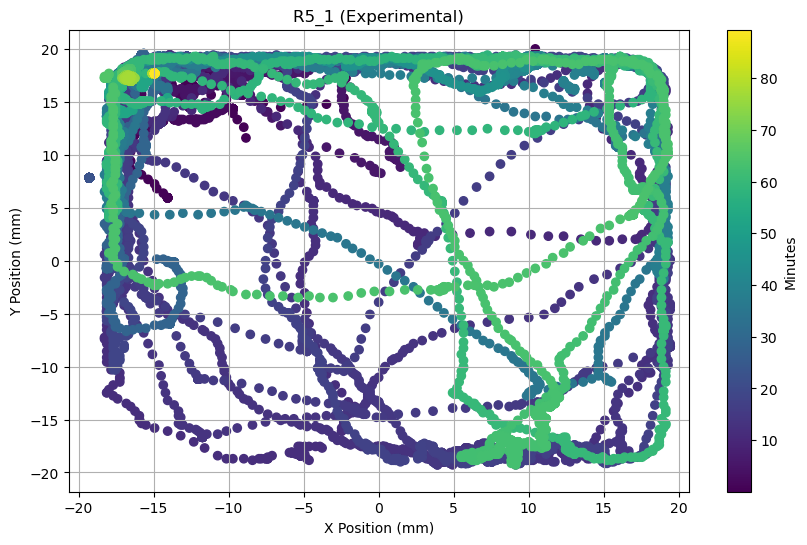

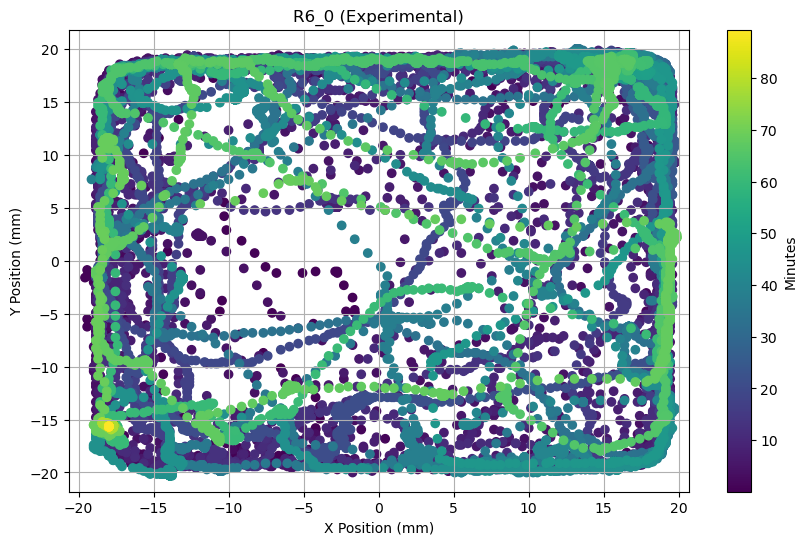

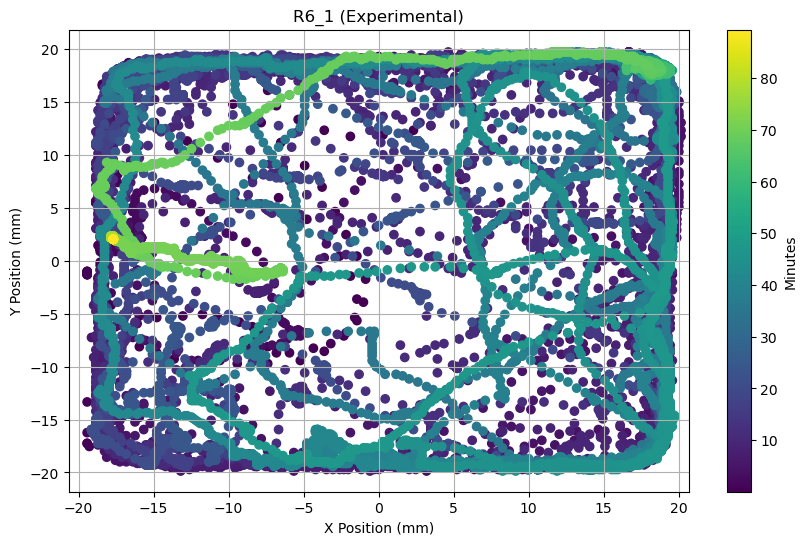

In [12]:
arena.plot_trackers_xy()